# CS 591 S1 -- Summer 1, 2020 -- HW 01


### Due date: Due Thursday, June 4th, @ midnight in GradeScope with 3 day grace period


### General Instructions

Please complete this notebook by filling in solutions where indicated. Be sure to "Run All" from the Cell menu before submitting. 

 
 

In [6]:
# General useful imports
import array
import contextlib
import wave
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import Audio



from numpy import arange,linspace,mean, var, std, corrcoef, cov, transpose, ones,log,pi, sin, cos, exp, abs, angle
from numpy.random import random, randint, uniform
from math import gcd
from cmath import polar
from pylab import *
from scipy import signal


%matplotlib inline

# Basic parameters for reading and writing mono wave files

numChannels   = 1                      # mono
sampleWidth   = 2                      # in bytes, a 16-bit short
SR            = 44100                  #  sample rate
MAX_AMP       = (2**(8*sampleWidth - 1) - 1)    #maximum amplitude is 2**15 - 1  = 32767
MIN_AMP       = -(2**(8*sampleWidth - 1))       #min amp is -2**15
windowWidth   = 4410
windowSlide   = 2205

# Basic Numpy statistical functions

X = np.array([1,2,3])       # just an example
Y = np.array([4,5,6])
             
# mean of a list
mean(X)                            


# Clip a signal or a scalar to upper and lower bounds, if not specified, us
# bounds provided above; will change the array in place and return it.
# Does NOT make a new copy. 

def clip(X,lb=MIN_AMP,ub=MAX_AMP):
    
    if type(X) != list and type(X) != numpy.ndarray:
        return max(min(X[k],MAX_AMP),MIN_AMP)
    
    for k in range(len(X)):
        X[k] = max(min(X[k],MAX_AMP),MIN_AMP)
    return X

# To prevent clipping, this function takes a signal and scales it so the max amplitude
# is A; the result is coerced back into integers

def scaleSignal(X,A=MAX_AMP):
    s = A/max(X)
    return np.array( [ x*s for x in X ] ).astype(int)


# I/O for Wave files

# Read a mono wave file from a local file and return the entire file as a 1-D numpy array

def readWaveFile(infile,withParams=False,asNumpy=True):
    with contextlib.closing(wave.open(infile)) as f:
        params = f.getparams()
        frames = f.readframes(params[3])
        if(params[0] != 1):
            print("Warning in reading file: must be a mono file!")
        if(params[1] != 2):
            print("Warning in reading file: must be 16-bit sample type!")
        if(params[2] != 44100):
            print("Warning in reading file: must be 44100 sample rate!")
    if asNumpy:
        X = array.array('h', frames)
        X = np.array(X,dtype='int16')
    else:  
        X = array.array('h', frames)
    if withParams:
        return X,params
    else:
        return X

# Write out an array as a wave file to the local directory
        
def writeWaveFile(fname, X):
    X = [clip(x) for x in X]
    params = [1,2, SR , len(X), "NONE", None]
    data = array.array("h",X)
    with contextlib.closing(wave.open(fname, "w")) as f:
        f.setparams(params)
        f.writeframes(data.tobytes())
    print(fname + " written.")


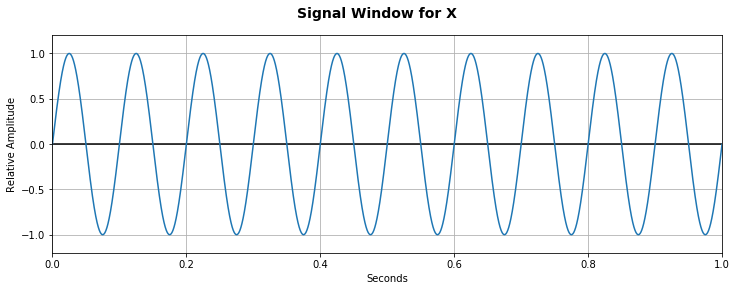

In [7]:
# Display a graph of a signal

def displaySignal(X, left = 0, right = -1, minAmp=-1.2, maxAmp=1.2,title='Signal Window for X',signalRelative=False,xUnits = "Seconds", yUnits = "Relative",width=12, height=4):
    
    if(signalRelative):
        X = [x*MAX_AMP for x in X]
    minAmplitude = -(2**15 + 100)        # just to improve visibility of curve
    maxAmplitude = 2**15 + 300    
    
    if(xUnits == "Samples"):
        if(right == -1):
            right = len(X)
        T = range(left,right)
        Y = X[left:right]
    elif(xUnits == "Seconds"):
        if(right == -1):
            right = len(X)/44100
        T = np.arange(left, right, 1/44100)
        leftSampleNum = int(left*44100)
        Y = X[leftSampleNum:(leftSampleNum + len(T))]
    elif(xUnits == "Milliseconds"):
        if(right == -1):
            right = len(X)/44.1
        T = np.arange(left, right, 1/44.1)
        leftSampleNum = int(left*44.1)
        Y = X[leftSampleNum:(leftSampleNum + len(T))]
    else:
        print("Illegal value for xUnits")
        
    if(yUnits == "Relative"):
        minAmplitude = minAmp            # just to improve visibility of curve
        maxAmplitude = maxAmp
        Y = [x/32767 for x in Y]

    fig = plt.figure(figsize=(width,height))   # Set x and y dimensions of window: may need to redo for your display
    fig.suptitle(title, fontsize=14, fontweight='bold')
    ax = plt.axes()
    if(xUnits=="Samples"):
        ax.set_xlabel("Sample Number")
    else:
        ax.set_xlabel(xUnits)
    ax.set_ylabel(yUnits + ' Amplitude')
    ax.set_ylim([minAmplitude,maxAmplitude])
    ax.set_xlim([left, right])
    plt.axhline(0, color='black')      # draw the 0 line in black
    plt.plot(T,Y) 
    if(    (xUnits == "Samples" and (right - left) < 101)
        or (xUnits == "Seconds" and (right - left) < 0.001)
        or (xUnits == "Milliseconds" and (right - left) < 1) ):
            plt.plot(T,Y, 'ro')                     
    plt.grid(True)                     # if you want dotted grid lines
    plt.show()
    
f = 10
T = np.arange(SR*1)
X = MAX_AMP * np.sin(2*pi*f*T/SR)

displaySignal(X)

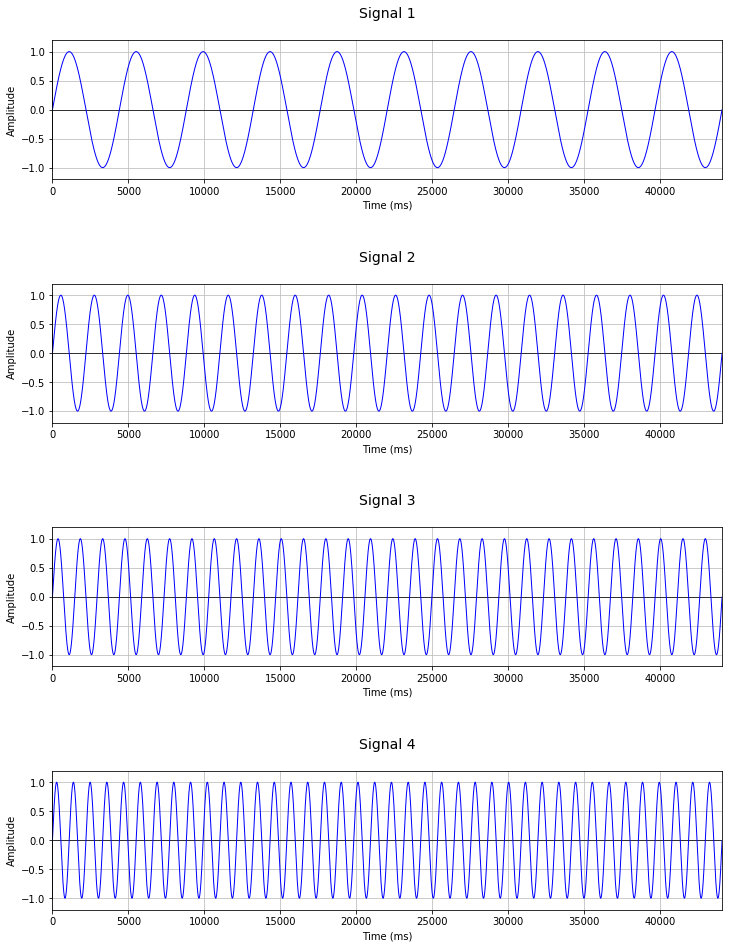

In [8]:
# This will display a list of signals in aligned subplots, with separate titles

def plotSignals(signals, titles=[]):
    print()
    if titles == []:
        if len(signals) > 1:
            titles = ['Signal ' + str(k+1) + '\n' for k in range(len(signals))]
        else:
            titles = ['Signal\n']
    else:
        titles = [t + '\n' for t in titles]
            
    number_of_subplots=len(signals)
    
    N = len(signals[0])

    fig = plt.figure(figsize=(12,number_of_subplots*4))
    fig.subplots_adjust(hspace=0.75)
    #fig.suptitle("Comparison ",fontsize=16)
    
    for i,v in enumerate(range(number_of_subplots)):
        v = v+1
        ax1 = subplot(number_of_subplots,1,v)
        
        ax1.set_ylabel('Amplitude')
        ax1.set_xlabel('Time (ms)') 
        ax1.plot([0,N-1],[0,0],color='black',lw=0.75)
        ax1.plot([0,0],[-1,1],color='black',lw=0.75)    
        ax1.set_ylim([-1.2,1.2])
        plt.xlim([0,N-1])
        ax1.grid(color='0.75')
        ax1.plot(signals[i],color='b',lw=1)
        ax1.set_title(titles[i],fontsize=14)
    plt.show()

# Just an example
  
f = 10
T = np.arange(SR*1)
X10 = np.sin(2*pi*f*T/SR)
X20 = np.sin(2*pi*2*f*T/SR)
X30 = np.sin(2*pi*3*f*T/SR)
X40 = np.sin(2*pi*4*f*T/SR)

plotSignals([X10,X20,X30,X40])

## Periodic Signals  


A <b> signal </b> $X$ is just a function from non-negative integers into the reals:

$$X\,:\,  [0,1,.., (N-1)]\,\rightarrow\,[-A..A]$$

where $t = 0, 1, 2, ...., N-1$ represents time (in some units, such as samples, i.e., 1/44100 = .00002268 secs) and $[-A..A]$ represents the amplitude of the signal. With
a simple sine wave (as in your calculus class), A = 1.0, but in this class, we
will have integers in the range $[- 2^{15} .. 2^{15}-1],$ due to the representation of signals as 16-bit integers (as in CD-quality sound). 

Several things to keep in mind about this data structure for signals:

- An amplitude value can be considered *absolute* if it represents the actual value in the range $[- 2^{15} .. 2^{15}-1],$ or *relative* if it is scaled (by dividing all values by MAX_AMP = $2^{15}-1$) into the range $[0..1]$. 
 
- A time value can be given in units of *samples* or in units of *seconds*, by scaling in one direction or the other by SR = 44,100. 
    
A <b> periodic signal </b> $X$ has a pattern that repeats every $p$ time units,by  where $p$ is called the <b> period</b>. Technically, a signal $X$ of length $N$ is periodic if there exists $p>0$ such that

$$X[x] = X[x+p]\text{ for } 0\le x\lt N-p$$


In this course we will generally be dealing with signals that are periodic, with some modulation of the amplitude.  
The sample rate will always be 44,100 and the sample type 16-bit integers. 

### Problem One

Consider the following signal, created by the formula $y = A \cdot sin(\,2\pi\, f\, t + \phi\,)$, for some values of the parameters $A$, $f$, and $\phi$:

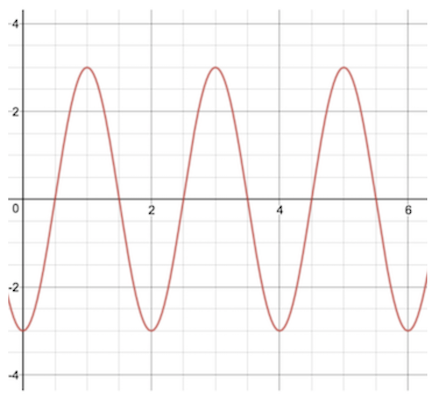

 <p>Give values for each of the parameters <em>A</em>, <em>f, </em>and <em>&phi;</em> under the conditions stated:</p>
 
<p>(a)  A &gt; 0, f &gt; 0, and 0 &le; &phi; &le; 2&pi;.</p>
*Solution:*

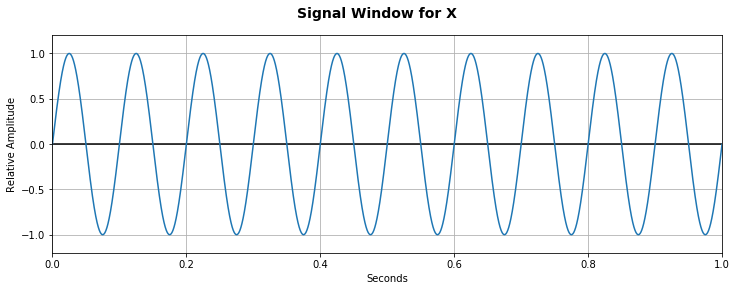

In [17]:
A = 3
f = 1/2
phi = (3pi)/2

 <p>(b)  A &gt; 0, f &gt; 0, and -&pi; &le; &phi; &le; 0.</p>
*Solution:*

In [ ]:
A = 3
f = 1/2
phi = -pi/2

 <p>(c) A &lt; 0, f &lt; 0 and -&pi; &le; &phi; &le; &pi;.</p>
*Solution:*

In [ ]:
A = -3
f = 1/2
phi = pi/2

 <p>(d) A &lt; 0, f &gt; 0 and -2&pi;&le; &phi; &le; 0.</p>
*Solution:*

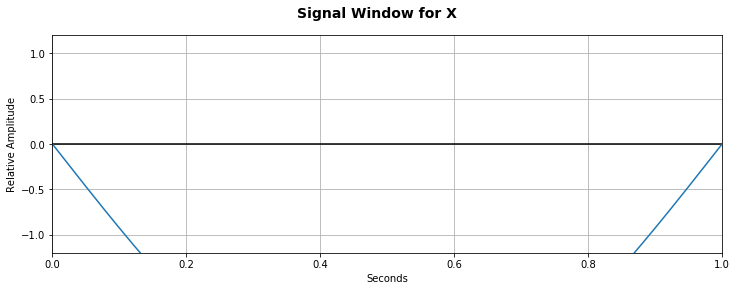

In [21]:
A = -3
f = 1/2
phi = (-3pi)/2

 <p>(e) A &gt; 0, f &lt; 0 and <span color='r'> -3&pi; &le; &phi; &le; -2&pi;.</span></p>
*Solution:*

In [ ]:
A = 3
f = 1/2
phi = -5pi/2

### Representing Spectra

We will represent a spectrum as a list of *(frequency, amplitude, phase)* triples: 

$$[ \ (\,f_0,\, A_0, \,\phi_0\,),\ (\,f_1,\, A_1,\, \phi_1\,),\, \ldots \ ].$$

Note carefully the following comments about the units involved:

- Frequency $f$ is stated in $Hz$ (cycles per second), but the sin function expects an argument in radians, so you will need to convert to radians per second;
- Amplitude $A$ is stated as a *relative* value, in the range $[0\ldots 1]$, so you will need to multiply
    the signal by (MAX_AMP * A) to get the appropriate amplitude for wave files; 
- Phase is represented in radians, typically in the range $(-\pi\ldots \pi].$


For the present, we will not worry about phase and assume that in all cases $\phi = 0.$

The following code will produce some sample spectra we will use below. In a later
part of the course we will discuss how to derive these spectra from musical signals. 

In [10]:
# some useful spectra    

def makeSpectrum(instr,freq=220):
    if(instr=="triangle"):
        return ([(freq,1.0,0.0),    
        (freq*3,-1/(9),0.0), 
        (freq*5,1/(25),0.0), 
        (freq*7,-1/(49),0.0), 
        (freq*9,1/(81),0.0), 
        (freq*11,-1/(121),0.0), 
        (freq*13,1/(13*13),0.0)])
    elif(instr=="square"):
        return ([(freq,2/(np.pi),0.0), 
        (freq*3,2/(3*np.pi),0.0), 
        (freq*5,2/(5*np.pi),0.0), 
        (freq*7,2/(7*np.pi),0.0), 
        (freq*9,2/(9*np.pi),0.0), 
        (freq*11,2/(11*np.pi),0.0), 
        (freq*13,2/(13*np.pi),0.0),
        (freq*15,2/(15*np.pi),0.0),
        (freq*17,2/(17*np.pi),0.0),
        (freq*19,2/(19*np.pi),0.0),
        (freq*21,2/(21*np.pi),0.0)])
    elif(instr=="clarinet"):
        return ([(freq,0.314,0.0), 
        (freq*3,.236,0.0), 
        (freq*5,0.157,0.0), 
        (freq*7,0.044,0.0), 
        (freq*9,0.157,0.0), 
        (freq*11,0.038,0.0), 
        (freq*13,0.053,0.0)] ) 
    elif(instr=="bell"):
        return ([(freq,0.1666,0.0), 
        (freq*2,0.1666,0.0), 
        (freq*3,0.1666,0.0), 
        (freq*4.2,0.1666,0.0), 
        (freq*5.4,0.1666,0.0), 
        (freq*6.8,0.1666,0.0)])  
    elif(instr=="steelstring"):
        return ([(freq*0.7272, .00278,0.0),
        (freq, .0598,0.0),
        (freq*2, .2554,0.0),
        (freq*3, .0685,0.0),
        (freq*4, .0029,0.0),
        (freq*5, .0126,0.0),
        (freq*6, .0154,0.0),
        (freq*7, .0066,0.0),
        (freq*8, .0033,0.0),
        (freq*11.0455, .0029,0.0),
        (freq*12.0455, .0094,0.0),
        (freq*13.0455, .0010,0.0),
        (freq*14.0455, .0106,0.0),
        (freq*15.0455, .0038,0.0)])
    elif(instr=='organ'):
        return ([(freq*1, 0.16042589643241895, 0.0),
        (freq*2, 0.1655, 0.0),
        (freq*3, 0.0015, 0.0),
        (freq*3.9949, 0.02161, 0.0),
        (freq*5.9949, 0.04552, 0.0),
        (freq*7.9949, 0.0324, 0.0),
        (freq*9.9899, 0.00242, 0.0),
        (freq*11.9898, 0.0045, 0.0),
        (freq*17.9847, 0.0057, 0.0),
        (freq*19.9796, 0.0011, 0.0),
        (freq*27.9745, 0.0008, 0.0),
        (freq*29.9745, 0.0016, 0.0)]        
        )
    else:
        return []
    
# example

makeSpectrum('triangle',1000)

[(1000, 1.0, 0.0),
 (3000, -0.1111111111111111, 0.0),
 (5000, 0.04, 0.0),
 (7000, -0.02040816326530612, 0.0),
 (9000, 0.012345679012345678, 0.0),
 (11000, -0.008264462809917356, 0.0),
 (13000, 0.005917159763313609, 0.0)]

### Problem Two (Simple Additive Synthesis)

We will write a function `makeSignal` and use it to create simple signals in the rest
of this homework; you can basically follow the formula given in lecture, however, the maximum amplitude of the resultant signal is hard to calculate, because of the various amplitudes in the component sine waves added together.   If you go over MAX_AMP, the signal will be *clipped* by the DAC at the `MAX_AMP` and this produces distortion. 

Therefore, after creating the signal, you must adjust the amplitude
by

- Finding the maximum sample in the signal ;
- Scaling by using an appropriate factor to reduce/expand the maximum amplitude to the relative amplitude given by `maxamp`; and 
- Converting the signal back into integers (since all this multiplying will have produced floating-point numbers). 

The function `scaleSignal` is provided in the next code cell which performs this task. 

By 'relative amplitude' we mean in the range $[0..1]$; to convert to absolute amplitude (as in the actual samples of the wave file), you would need to multiply this by `MAX_AMP`. 

For each of the signals specified in Parts A -- D, you must

- Display some reasonable version of the signal using `displaySignal` in which you can see about 3 - 10 cycles of the sinusoid (just slice the signal to display only part of it); and
- Listen to it using the `Audio` function demo'd in lecture on Thursday. 


In [5]:
def scaleSignal(X,A=MAX_AMP):
    s = A/max(X)
    return np.array( [ x*s for x in X ] ).astype(int)

### Part A

Complete the following template to convert a spectrum, a relative amplitude and a duration (in secs) into a signal.  

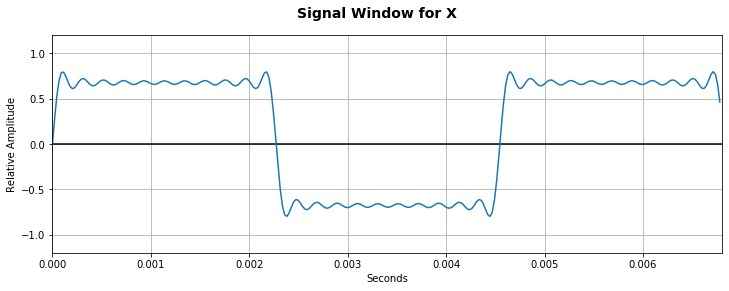

In [11]:
# returns a signal specified by the spectrum = array of triples (frequency,amplitude,phase) 
# The length should be `duration` seconds long. 

# Some defaults have been provided so you can call `makeSignal()` if you just want
# an example signal. 

def makeSignal(S, amp, duration):
    # Your code here
    #loop thru spectrum to extract freqeuncy to create sinusoid
    #and sum amplitude
    
    T = np.arange(SR*duration)                          #time in sample numbers
    X = np.zeros(int(SR*duration))                           #cold signal
    for (f,a,ph) in S:
        tempsig = a * MAX_AMP * sin(2* pi*f*T/SR + ph)
        X += tempsig 
    return scaleSignal(X, amp * MAX_AMP)

#A = signal[1] * MAX_AMP * amp
# Test default signal

#X = makeSignal()
#displaySignal(X)
#Audio(X,rate=SR)
x = makeSpectrum('square')
y= makeSignal(x, .8, 3)
displaySignal(y[:300])
Audio(y, rate=SR)

### Part B

Using your definition of `makeSignal`, create a square wave of fundamental frequency 261.63 (middle C), maximum amplitude 0.8, and length 3 seconds.  Display it using `displaySignal` and listen to it using `Audio`. 

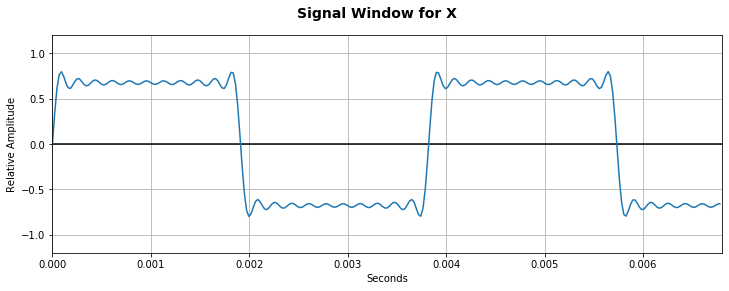

In [19]:
Square = makeSignal(makeSpectrum('square', 261.63), .8, 3)

displaySignal(Square[:300])

Audio(Square, rate = SR)

### Part C

Create an organ signal of fundamental frequency 36.708 (D2), amplitude 0.8, and length 2 seconds. Display the signal and listen to it, as in Part B. 

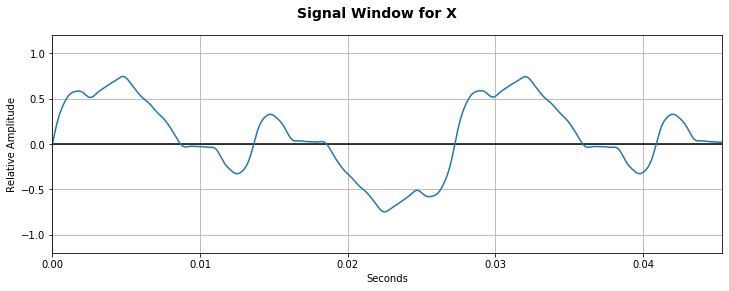

In [26]:
organ = makeSignal(makeSpectrum('organ', 36.708), 0.8, 2)
displaySignal(organ[:2000])

Audio(organ, rate = SR)

### Part D

Create a bell signal of fundamental frequency 1036.5 (C6), amplitude 0.65, and length 2 seconds. Display and listen. 

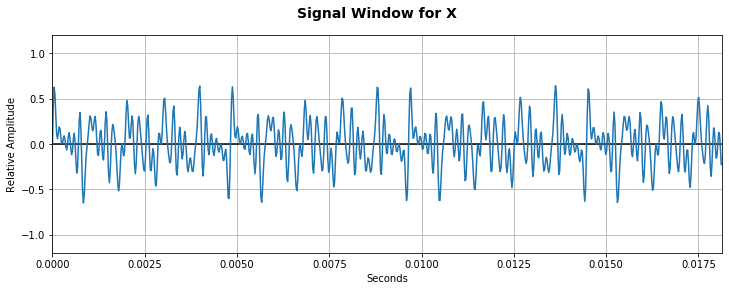

In [32]:
bell = makeSignal(makeSpectrum('bell', 1036.5), 0.65, 2)
displaySignal(bell[:800])

Audio(bell, rate = SR)

### Problem Three (Amplitude Envelope Shaping-- Swell)

The amplitude level of actual musical signals is not constant, of course, and so
we have to think about how to shape the amplitude 'envelope' to create more realistic
musical signals. 

For this problem, you will learn to create a basic amplitude envelope (a *swell*) which takes a signal and modifies it to start at amplitude 0, increase linearly until it reaches its full amplitude halfway through the signal, and then decreases linearly to end at amplitude 0. The signal will thus have a *diamond* shape, e.g., 


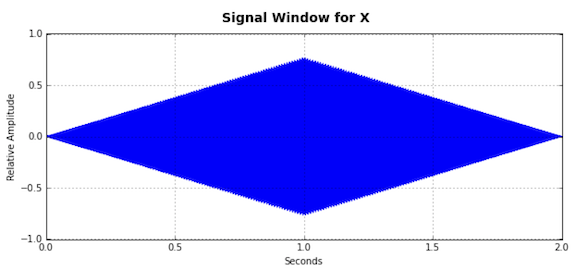

The way we will apply amplitude envelopes is simply to multiply the signal vector
by the envelope vector. Therefore, an *envelope* will be an array of floats in the range $[0..1]$ which is multiplied by the signal, and results in a new signal in which every sample has been scaled to conform to the envelope. After multiplying a array of floats (the envelope) by an array of integers (the signal), you will get an array of floats, so you will need to convert back to an array of integers using the `astype(int)` method (as in the last problem). 

</p>

### Part A

Complete the following template, which should produce the example shown. Do not worry too much about the exact behavior of the envelope at the endpoints and middle; for example, if
you do not exactly hit 1.0 in the center, no worries, you won't hear it!

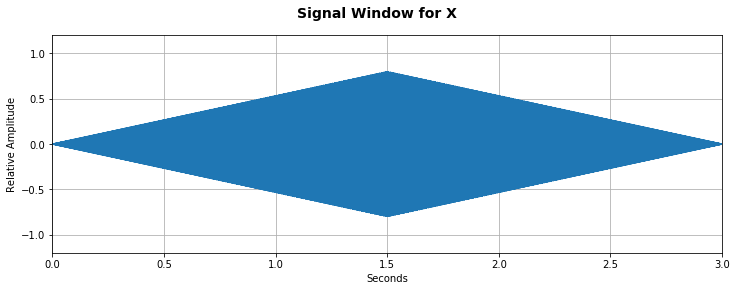

In [9]:
def applySwell(X):
    # Your code here
    pivot = np.floor(len(X)/2)                #figure out halfway point
    left = np.linspace(0, 1, pivot)           #create left subarray
    right = np.linspace(1,0, pivot)           #create right subarray
    envelope = np.concatenate((left, right), axis = None)  #concat to make envelope
    return np.array(envelope* X).astype(int)       

# test
S= [(220,1,1)]
X = applySwell( makeSignal(makeSpectrum('square'), .8, 3) )
displaySignal(X)
#Audio(X,rate=SR)

### Part B

Now you must create a clarinet signal of frequency 392 Hz (D4), amplitude 1.0, and of 5 seconds duration, and apply the swell envelope. As in the last problem, you must display the signal (this time, the entire signal), and also listen to it using `Audio`. 

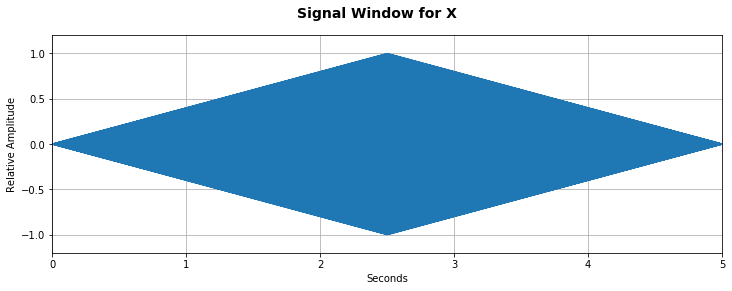

In [33]:
clarinet = applySwell(makeSignal(makeSpectrum('clarinet', 392), 1, 5))
displaySignal(clarinet)
Audio(clarinet, rate = SR)

### Problem Four (Amplitude shaping -- Tremolo)

Tremolo is the constant wavering of amplitude in a signal, typically following a sine wave shape: 

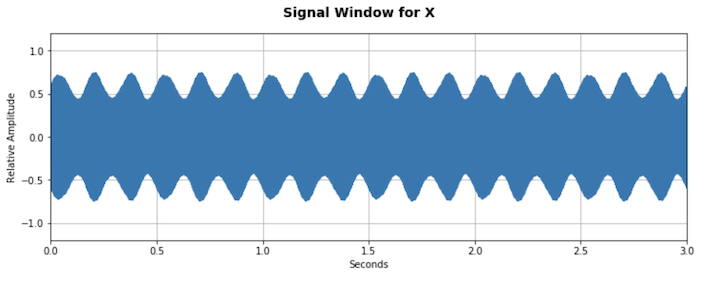

### Part A

Complete the following template to create a tremolo envelope with the following parameters:

- Frequency f of the amplitude oscillation; 
- Depth d  of the oscillation, i.e, by what percentage is the amplitude reduced at the 'bottom' of the tremolo; and
- Duration of the envelope. 

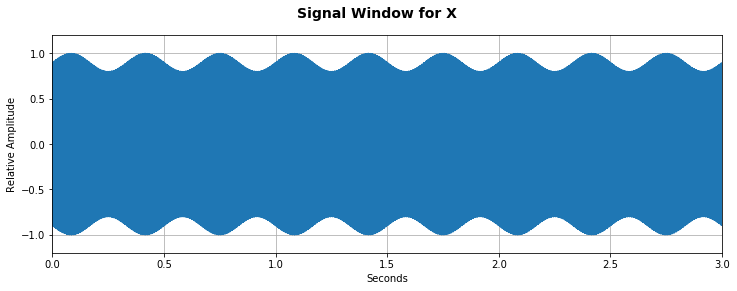

In [12]:
def applyTremolo(X,f,d):
    # Your code here
    T = np.arange(len(X))             #create cold envelope: should be good since SR*duration = len(X)
    oscilamp = d/2                      #find amplitude of oscillation
    envelope = oscilamp* sin(2 * pi * f * T/SR) +(1-oscilamp)  # sine envelope that adjusts amplitude to values of sine function
    
    return envelope * X       # this is just to get it to compile

# Test it

X = applyTremolo( makeSignal(makeSpectrum('square'), 1, 3), 3, .2 )
displaySignal(X)
Audio(X,rate=SR)

### Part B

Now create a steel string guitar signal of frequency 220 Hz, amplitude 0.75, and duration 3 seconds,
then apply a tremolo with frequency 6 Hz and depth 0.2. Display it and listen to it using `Audio`. 

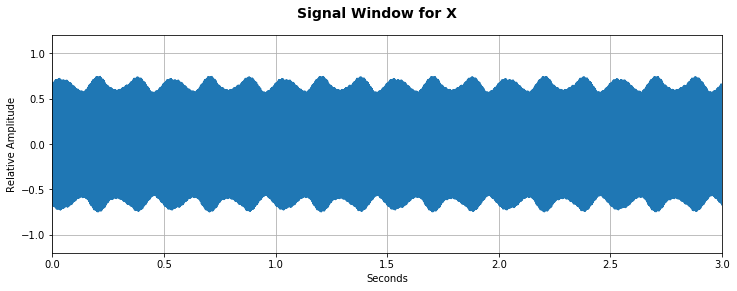

In [87]:
X = applyTremolo( makeSignal(makeSpectrum('steelstring', 220), .75, 3), 6, .2 )
displaySignal(X)
Audio(X,rate=SR)

### Part C

Now create a bell signal of frequency 2093 (C7) Hz, amplitude 0.6, and duration 4 seconds,
then apply a tremolo with frequency 3 Hz and depth 0.5. 

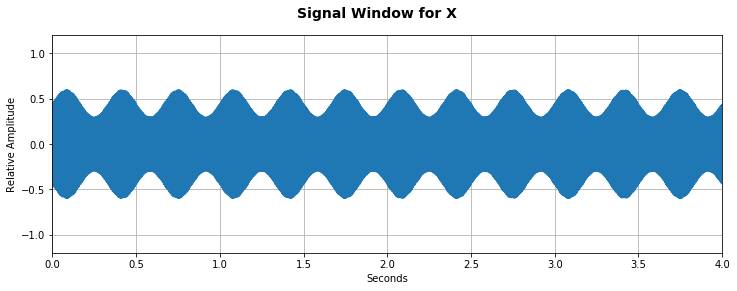

In [88]:
X = applyTremolo( makeSignal(makeSpectrum('bell', 2093), .6, 4), 3, .5 )
displaySignal(X)
Audio(X,rate=SR)

### Part D

Finally,  create an organ signal of frequency 97.999 (G2) Hz, amplitude 0.85, and duration 4 seconds,
then apply a tremolo with frequency  8 z and depth 0.2. 

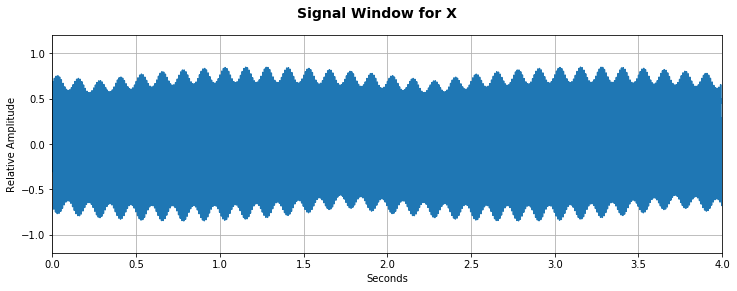

In [89]:
X = applyTremolo( makeSignal(makeSpectrum('organ', 97.999), .85, 4), 8, .2 )
displaySignal(X)
Audio(X,rate=SR)

 ### Amplitude Modulation:    ADSR envelopes
 
 When trying to synthesize a musical note, we have to deal with the way various instruments shape the amplitude envelope. Typically, this shape can be defined by
 
- Attack: How the signal grows from 0 to an initial maximum value;
- Decay: How the initial maximum decreases somewhat after the initial impetus of the sound;
- Sustain: The portion of the note where the amplitude is fairly constant; and
- Release: The end of the note, where the note fades away.

The attack and decay phases will be described by linear functions, but the
release phase is described by an exponential decay function. 

One could also create an exponential increase for the attack, exponential decay
for the decay, however, these phases are typically short and it would be difficult
to actually hear the difference, so a simpler implementations seems appropriate. 

Not all notes created by all instruments follow this exact sequence, and some
parts might be missing: for example, pianos, guitars, and percussion instruments
have no sustain phase, as the note, once struck, starts to die away immediately.
Organs have essentially no decay or release phase. Many instruments can vary
the amplitude arbitrarily, and so a constant-amplitude sustain phase may not
be realistic. 

Nevertheless, this is a good first approximation, and it can be refined by adding
other features, such as tremolo. 

We will consider three basic envelopes for wind, percussion (including guitar and piano), and for organ. 

### Problem Five (ASDR)

In this problem you will write a function `getADSR` which will create an envelope
with the following shape and parameters:

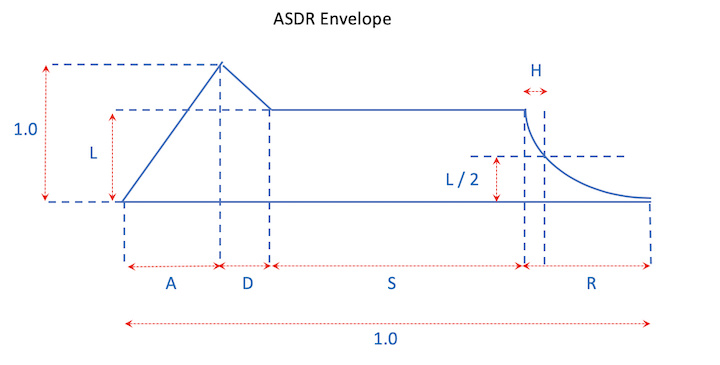

   
- A, D, S, R = relative length of each phase as a percentage of the whole envelope;
- L = relative level during sustain phase, as percentage of maximum, e.g., 0.5 is sustain at half max value; and
- H = relative half-life of exponential decay during R phase (time for amplitude to be reduced by half), as a percentage of the whole envelope.

Note carefully that all the units are relative values in the range $[0..1]$ and that
we must have $A+D+S+R = 1.0.$
   

### Part A

Complete the following template. One approach is to create the envelope (a list of floats) first,
one phase as a time, and then apply it to the signal; alternately you can
adjust the signal itself using the parameters.  I found the first approach much
less confusing, because keeping track of the indices is a real pain in the second approach. 


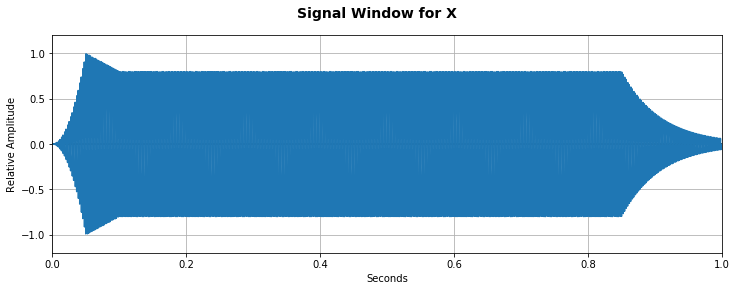

In [13]:
def applyADSR(envelope, X):
    (A,D,S,R,L,H) = envelope
    N = len(X)
    
    # convert units from relative(percentage) to sample count
    A = int(A*N)        #attack phase amplitudes over time         
    D = int(D*N)        #decay
    S = int(S*N)        #sustain
    R = N - (A+D+S)     #release, to make sure floating point arith didn't screw up the count
        
    # Your code here
    attackamps = np.linspace(0, 1, A)           #create attack subarray
    expattack = np.array([a**2 for a in attackamps])
    decayamps = np.linspace(1,L, D)             #create decay subarray 
    sustainamps = np.linspace(L,L, S)            #create sustain subarray
    
    halflifetime = np.arange(R)      #just time, gotta figure out shape
    Hsamples = H * SR
    relamps = np.array([L*((.5)**(t/Hsamples)) for t in halflifetime]) # hopefully decay rate lol
    ADSR = np.concatenate((expattack, decayamps, sustainamps, relamps), axis = None)
    return ADSR*X     # Just to get it to compile
                  
# Test with default signal

#X = makeSignal()
#E = (0.05, 0.05, 0.75, 0.15,0.8,0.04)
#X = applyADSR(E,X)


y= makeSignal(makeSpectrum('clarinet'), 1, 1)
test = (0.05, 0.05, 0.75, 0.15,0.8,0.04)
X = applyADSR(test,y)

displaySignal(X)

#Audio(X,rate=SR)

### Part B

Now you will take some typical envelopes for wind, percussion, and organ, and for each, apply it to
the appropriate signal (clarinet, steel string guitar, and organ) with a frequency
of 261.63 (Middle C), amplitude of 0.8, and duration of 3 seconds. 

For each, display and listen. 
 

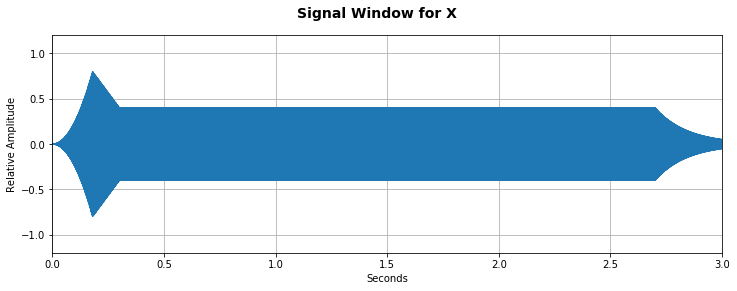

In [14]:
wind_envelope = (0.06,0.04,0.8,0.1,0.5,0.1)

# Your code here   Use clarinet spectrum

y= makeSignal(makeSpectrum('clarinet', 261.63), .8, 3)
test = (0.05, 0.05, 0.75, 0.15,0.8,0.04)
X = applyADSR(wind_envelope,y)

displaySignal(X)
Audio(X, rate = SR)

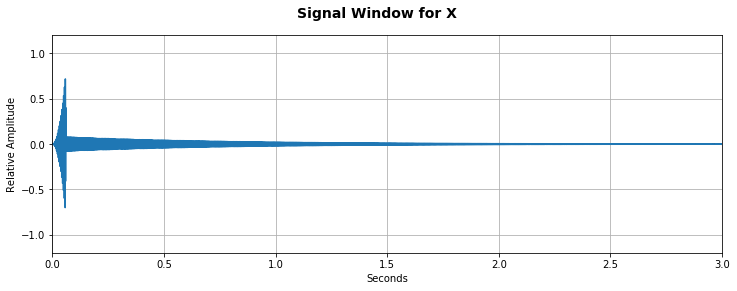

In [16]:
percussion_envelope = (0.02,0.0,0.0,0.98,0.1,0.5)
# Your code here    Use steelstring spectrum

y= makeSignal(makeSpectrum('steelstring', 261.63), .8, 3)
X = applyADSR(percussion_envelope,y)

displaySignal(X)
Audio(X, rate = SR)

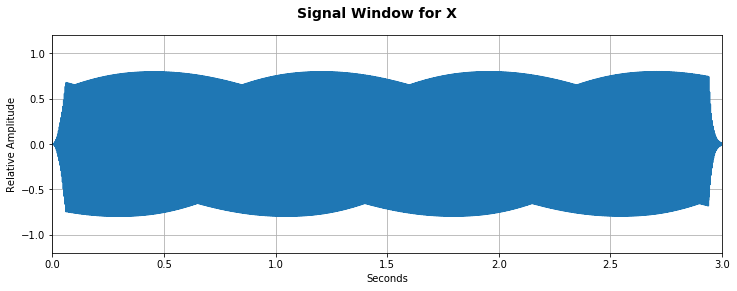

In [15]:
organ_envelope = (0.02,0,0.96,0.02,1,0.01)
# Your code here    Use organ spectrum

y= makeSignal(makeSpectrum('organ', 261.63), .8, 3)
X = applyADSR(organ_envelope,y)

displaySignal(X)
Audio(X, rate = SR)

### Part C

Now we will investigate how the tremolo and the ADSR envelopes might work together.
The problem is that tremolo is generally created by the player, and does not
apply during the attack and decay phase.  We *could* rewrite the ASDR function
to only apply tremolo during the attack and release phases, but for
now we will simply apply the tremolo to signals which have a fast attack and
little or no decay, such as the guitar or bell. 

Create a bell sound with frequency 1036.5, amplitude 1.0, of duration 6 seconds,
then apply the percussion envelope,
and THEN apply tremolo with a frequency of 2 and a depth of 0.2. 

Show the signal with `displaySignal` and listen to it with `Audio`. 

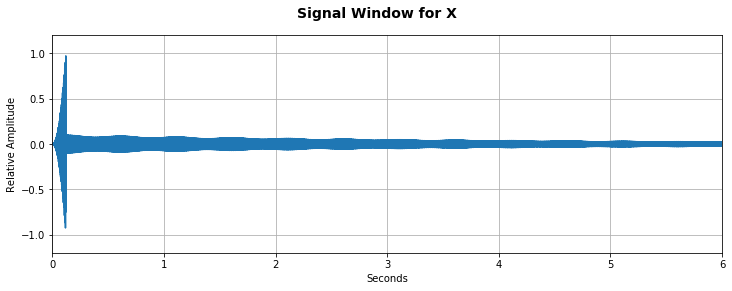

In [93]:
X = applyADSR(percussion_envelope, makeSignal(makeSpectrum('bell', 1036.5), 1, 6))
X = applyTremolo(X, 2, .2)
displaySignal(X)
Audio(X, rate = SR)

### Problem Six

Now we will consider how we might put together notes to create music. 
The first step is to calculate the frequency of the notes on the piano
keyboard, which are probably all we reasonably need. 

In well-tempered tuning, the frequencies are a geometric series, in which the difference in frequency between each
semitone is the twelfth root of 2, i.e., $2^{1/12}$. Using this factor, you can see
that in going up the chromatic scale (12 notes) from, say, C2 to C3, you will increase
the frequency by $(2^{1/12})^{12}\,=\, 2,$ which is exactly what we need for the frequency
of the octave. This relationship holds no matter which note you start on, which
provides for the ability to play in any key and have the relationships stay the
same relative to each other.

Here is the piano keyboard with all  the frequencies and correspondences with staff notation:

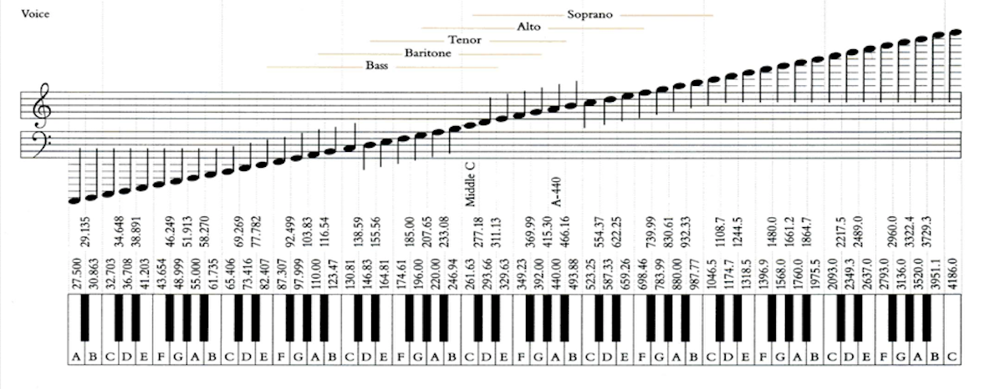

To distinguish the various octaves, they are numbered as follows:

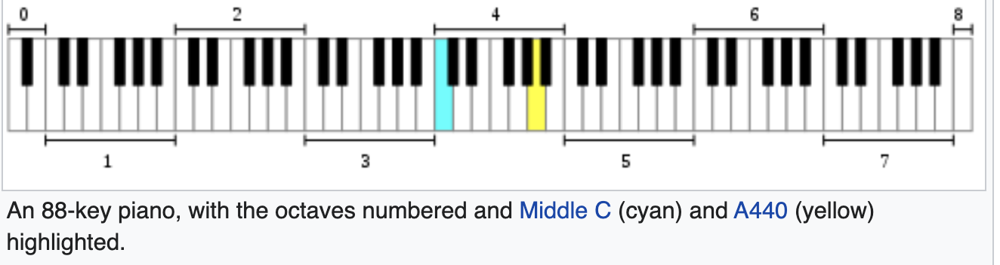

Therefore *Middle C* is C4 and A 440 is A4. The notenames of accidentals are 'C#2', 'Bb4', etc.    

A list of all possible note names is given in the next cell.

In [20]:
notenames = ['A0', 'Bb0', 'B0', 'C1', 'C#1', 'D1', 'Eb1', 'E1', 'F1', 'F#1',
       'G1', 'Ab1', 'A1', 'Bb1', 'B1', 'C2', 'C#2', 'D2', 'Eb2', 'E2',
       'F2', 'F#2', 'G2', 'Ab2', 'A2', 'Bb2', 'B2', 'C3', 'C#3', 'D3',
       'Eb3', 'E3', 'F3', 'F#3', 'G3', 'Ab3', 'A3', 'Bb3', 'B3', 'C4',
       'C#4', 'D4', 'Eb4', 'E4', 'F4', 'F#4', 'G4', 'Ab4', 'A4', 'Bb4',
       'B4', 'C5', 'C#5', 'D5', 'Eb5', 'E5', 'F5', 'F#5', 'G5', 'Ab5',
       'A5', 'Bb5', 'B5', 'C6', 'C#6', 'D6', 'Eb6', 'E6', 'F6', 'F#6',
       'G6', 'Ab6', 'A6', 'Bb6', 'B6', 'C7', 'C#7', 'D7', 'Eb7', 'E7',
       'F7', 'F#7', 'G7', 'Ab7', 'A7', 'Bb7', 'B7', 'C8', 'R']

### Part A   (Piano Key Frequencies)

Construct a dictionary `Freqs` which holds the frequencies, as shown above,
for every note on the piano. 


For reasons which will become obvious below, we will also include frequency 0, also
known as "silence." The note name for silence is 'R'. 

In [21]:
# Create chromatic scale, e.g., as on the piano, as a dictionary    

Freqs = {} 

# Your code here
frequencies = np.geomspace(27.5, 4186, 88)
for i in range(len(notenames)-1):
    Freqs[notenames[i]] = frequencies[i] 
Freqs['R'] = 0                    # a rest (silence) 

# test

print(Freqs)
Freqs['C4']

{'A0': 27.5, 'Bb0': 29.13523437127987, 'B0': 30.867704795251214, 'C1': 32.70319322593177, 'C#1': 34.64782543006454, 'D1': 36.70809143127713, 'Eb1': 38.890867169913825, 'E1': 41.20343745082739, 'F1': 43.653520255717346, 'F#1': 46.249292501154116, 'G1': 48.99941732825464, 'Ab1': 51.91307301508549, 'A1': 54.999983608286556, 'Bb1': 58.270451376144756, 'B1': 61.7353911914271, 'C2': 65.40636695872277, 'C#2': 69.29563020786632, 'D2': 73.41616098224463, 'Eb2': 77.78171115844765, 'E2': 82.40685034183879, 'F2': 87.3070144912167, 'F#2': 92.4985574348483, 'G2': 97.99880544980354, 'Ab2': 103.8261150867449, 'A2': 109.99993443315606, 'Bb2': 116.5408680194699, 'B2': 123.47074558471449, 'C3': 130.81269493117557, 'C#3': 138.59121911121952, 'D3': 146.83227820388308, 'Eb3': 155.5633759541491, 'E3': 164.81365156406036, 'F3': 174.613976942013, 'F#3': 184.99705973479294, 'G3': 195.997552486213, 'Ab3': 207.65216828665626, 'A3': 219.99980329949753, 'Bb3': 233.08166657332126, 'B3': 246.94141757317166, 'C4': 261

261.62531188983456

### Part B (Melody Maker)

We will now create sequences of notes, otherwise known as melodies. 
Each note will be specified by a triple     

       ( notename, amplitude, duration)   

where 

- notename is one of 'A0', 'Bb5', etc. as shown above, 
- amplitude is relative ([0..1] and 
- duration is in seconds. 

In addition, we will specify:

- an instrument  (from the list above, e.g., 'clarinet', 'steelstring', etc.), 
- an ADSR envelope (A, D, S, R, L, H) which will be applied to each note;

We also need a way of providing a *rest*, that is, silence, of a particular duration.
The simplest thing is to simply pick a random note and give it an amplitude of 0,
but for readability I'll allow you also to give the note name as 'R', in which case
the amplitude will be ignored and set to 0. A frequency of 0 will do the same thing.


Fill in the template below. 


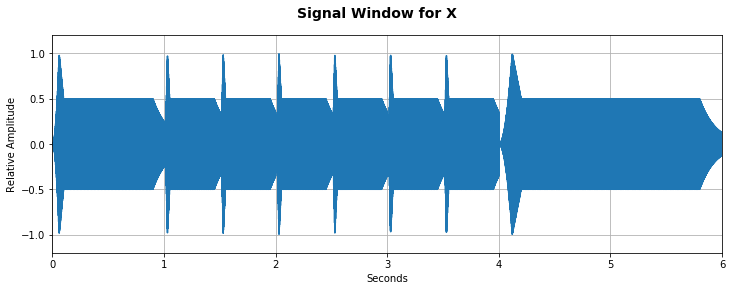

In [22]:
# Solution

def makeMelody(melody,instrument,envelope):
    # Your code here
    
    #signaler = lambda note, amp, duration: makeSpectrum(instrument, Freqs[notename])
    X =[]
    for (notename, amp, duration) in melody:
        if notename == "R":
            rest = np.zeros(int(duration*SR))
            X.append(rest)
        else:    
            sig = makeSignal(makeSpectrum(instrument, Freqs[notename]), amp, duration)
            sig = applyADSR(envelope, sig)
            X.append(sig)
            #X = np.concatenate((X, sig), axis = None)
    return np.concatenate(X)     

# Test by creating a C major scale

CM_scale = [('C4',1,1), ('D4',1,1/2), ('E4',1,1/2), ( 'F4', 1,1/2), 
            ('G4',1, 1/2), ('A4',1,1/2), ( 'B4',1,1/2),('C5',1,2)]

S = makeMelody(CM_scale,'clarinet',wind_envelope)
displaySignal(S)
Audio(S,rate=SR)

### Part C (The Lick)

The following is a common phrase used in Jazz (look up "The Lick" on YouTube). 

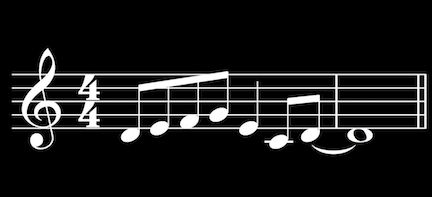

Construct this melody for the clarinet (using the wind envelope), display it, and give a call to Audio which plays the melody (we will run this when we grade it). 

Details of timing and tempo and so forth are up to you. Elisson and will be happy to
help you if you do not read music. 

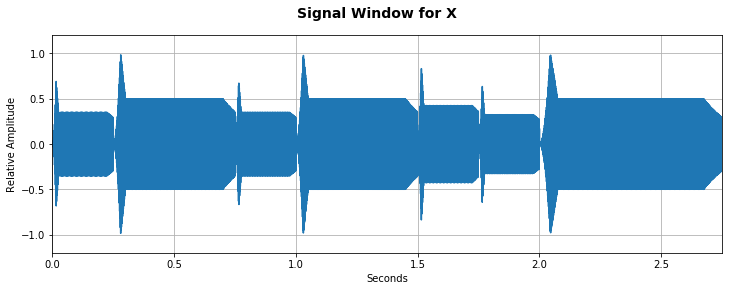

In [23]:
#Solution
notes = ['D4', 'E4', 'F4', 'G4', 'E4', 'C4', 'D4' ]
the_lick = [('D4', .7, .25), ('E4', 1, .5), ('F4', .7, .25), ('G4', 1, .5), ('E4', .85, .25), ('C4', .65, .25), ('D4', 1, .75)]
S = makeMelody(the_lick, 'clarinet', wind_envelope)
displaySignal(S)
Audio(S, rate = SR)

## Composing Music

In order to create interesting musical compositions, at least in the West, one generally
has more than one melody. This can easily by done by simply adding signals together.
One detail is that you have to make sure you do not exceed the MAX_AMP when
you add signals. One way to deal with this is to simply apply the function `scaleSignal`
after creating your masterpiece. 

## Polyphony

You can add signals together to make simulateous melodies, just make sure that
you don't exceed the maximum amplitude. You can apply `scaleSignal` if you think this
might be a problem. 

Here is a simple bit of polyphony, learned by piano students the world over, Bach's first
two-part invention. 

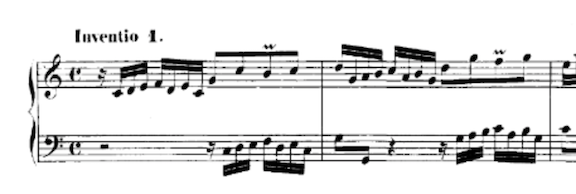

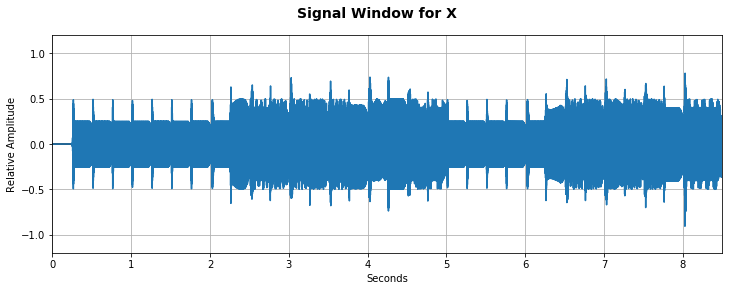

In [24]:
# Bach Two-Part Invention #1    MM = 60 beats per minute, quarter note is 1/4 sec

invention_treble = [ ('R',0,1/4),    ('C4',1/2,1/4),  ('D4',1/2,1/4), ('E4',1/2,1/4), 
              ('F4',1/2,1/4), ('D4',1/2, 1/4), ('E4',1/2,1/4), ( 'C4',1/2,1/4),
              ('G4',1/2,1/2),                  ('C5',1/2,1/2),
              ('B4',1/2,1/2),                  ('C5',1/2,1/2),
              ('D5',1/2,1/4), ('G4',1/2,1/4),  ('A4',1/2,1/4), ('B4',1/2,1/4),         
              ('C5',1/2,1/4), ('A4',1/2,1/4),  ('B4',1/2,1/4), ('G4',1/2,1/4),           
              ('D5',1/2,1/2),                  ('G5',1/2,1/2),
              ('F5',1/2,1/2),                  ('G5',1/2,1/2), 
              ('E5',1/2,1/2)
            ]

invention_bass = [ ('R',0,2),    
              ('R',0,1/4),    ('C3',1/2,1/4),  ('D3',1/2,1/4), ('E3',1/2,1/4), 
              ('F3',1/2,1/4), ('D3',1/2, 1/4), ('E3',1/2,1/4), ( 'C3',1/2,1/4),
              ('G4',1/2,1/2),                  ('G3',1/2,1/2),
              ('R',0,1), 
              ('R',0,1/4), ('G3',1/2,1/4),  ('A3',1/2,1/4), ('B3',1/2,1/4),         
              ('C4',1/2,1/4), ('A3',1/2,1/4),  ('B3',1/2,1/4), ('G3',1/2,1/4),           
              ('C4',1/2,1/2)   
            ]


X1 = makeMelody(invention_treble,'clarinet',(0.06,0.04,0.8,0.1,0.5,0.1))
X2 = makeMelody(invention_bass,'clarinet',(0.06,0.04,0.8,0.1,0.5,0.1))
X = X1 + X2
displaySignal(X)
# Audio(X,rate=SR)        # mono
Audio([X2,X1],rate=SR)  # stereo

### Digression: Chords and Harmony

If we play notes together, they form a *chord*; when the sense of the individual melodies
is not the point, but the sound as a whole, then we are in the realm of *harmony*. 

Our system is not set up for conveniently playing chords, but you could do it by
separating out all the different "voices" and treating them as individual melodies. 

## Canons (Rounds)

A canon, colloquially called a "round" is a melody that repeats exactly at some
time interval, such as "Row, Row, Row your Boat". 

These are particularly easy to construct, because we just have to 
repeat the melody exactly at some delay. 

#### Row, Row, Row your Boat

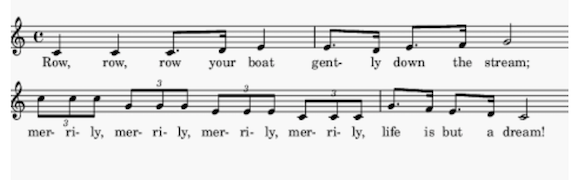

https://en.wikipedia.org/wiki/Row,_Row,_Row_Your_Boat

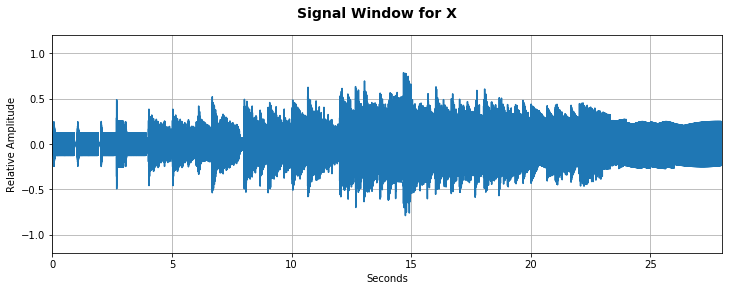

In [91]:
row =           [ ('C4',1/4,1),   ('C4',1/4,1),  ('C4',1/4,2/3), ('D4',1/2,1/3), ('E4',1/4,1), 
                  ('E4',1/4,2/3), ('D4',1/4, 1/3), ('E4',1/4,2/3), ('F4',1/4, 1/3),('G4',1/4,2), 
                  ('C5',1/4,1/3), ('C5',1/4,1/3), ('C5',1/4,1/3), 
                  ('G4',1/4,1/3), ('G4',1/4,1/3), ('G4',1/4,1/3), 
                  ('E4',1/4,1/3), ('E4',1/4,1/3), ('E4',1/4,1/3), 
                  ('C4',1/4,1/3), ('C4',1/4,1/3), ('C4',1/4,1/3),
                  ('G4',1/4,2/3), ('F4',1/4, 1/3), ('E4',1/4,2/3), ('D4',1/4, 1/3),('C4',1/4,2), 
                ]

# Convert a melody into a higher or lower pitch; delta is the number of semitones to move it

def transpose(M,delta):     # delta is in units of semitones
    return [ (notenames[ notenames.index(n) + delta ] ,a,d) for (n,a,d) in M ]
        
rest = np.zeros(SR*4)   # One quarter-note of rest

Sx = makeMelody(row,'clarinet',(0.06,0.04,0.8,0.1,0.5,0.1))
Ax = makeMelody(row,'bell',(0.02,0.0,0.0,0.1,0.98,0.5))
Tx = makeMelody(transpose(row,-12),'steelstring',(0.02,0.0,0.0,0.1,0.98,0.5))
Bx = makeMelody(transpose(row,-24),'organ',(0.02,0,0.96,0.02,1,0.01))

X1 = np.concatenate( [ Sx,  rest,rest,rest ] )
X2 = np.concatenate( [ rest,Ax,  rest,rest ] )
X3 = np.concatenate( [ rest,rest,Tx,  rest ] )
X4 = np.concatenate( [ rest,rest,rest,Bx ] )

X = X1+X2+X3+X4

displaySignal(X)
# Audio(X,rate=SR)               # mono
Audio([X3+X4,X1+X2],rate=SR)     # stereo

## Problem Seven:  Your Turn!

For this last problem, we want you to construct a melody, a piece of music, or an original composition (using the piano notes, so no weird "sound-scapes" -- yet! -- we'll get to that!). 

This is up to you, but you will be grading on what amount of effort you put into it. 
If you lack musical training to interpret all this, please ask for help and
Elisson and I will get you set up with enough background to do something interesting.
We will also post ideas on Piazza.  Please let us know if you need help developing your ideas. 


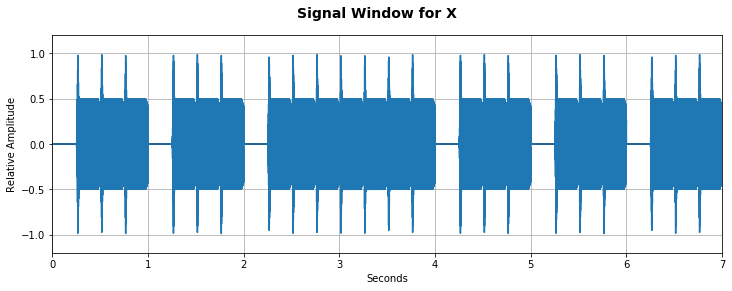

In [25]:
jinglebells =   [ ('R',0, 1/4),   ('E4', 1, 1/4),  ('D4', 1, 1/4), ('C4', 1, 1/4), ('R',0, 1/4), ('E4', 1, 1/4), ('D4', 1, 1/4), ('C4', 1, 1/4), ('R',0,1/4), ('F4',1, 1/4), ('E4',1,1/4), 
                  ('D4',1,1/4), ('G4',1,1/4), ('G4',1,1/4), 
                  ('F4',1,1/4), ('D4',1,1/4), ('R',0,1/4),   ('E4', 1, 1/4),  ('D4', 1, 1/4), ('C4', 1, 1/4), 
                  ('R',0,1/4),   ('E4', 1, 1/4),  ('D4', 1, 1/4), ('C4', 1, 1/4), ('R',0,1/4), ('F4',1, 1/4), ('E4',1,1/4), 
                  ('D4',1,1/4) 
                ]
X = makeMelody(jinglebells, 'clarinet', wind_envelope)
displaySignal(X)
Audio(X, rate = SR)

#i super don't know how to read sheet music i am so sorry this is so boring